## pix-to-pix vs cycle-gan
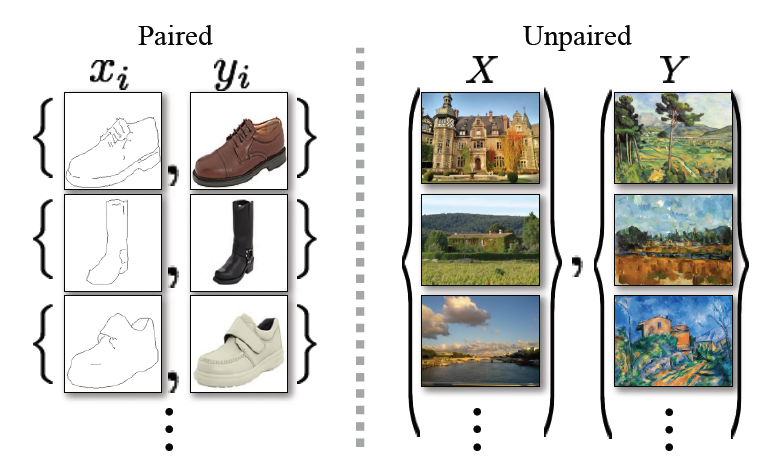

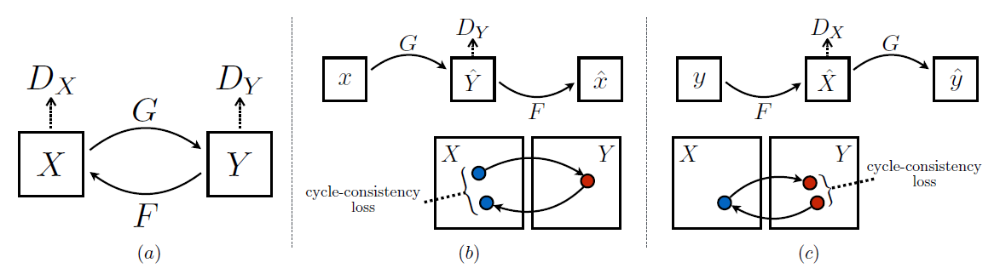

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.utils as vutils
from PIL import Image
import glob

In [2]:
orig_img_size = (286, 286)
input_img_size = (256, 256)
batch_size = 1
root = './horse2zebra'

In [3]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Linear) :
        torch.nn.init.normal_(m.weight, mean=0, std=0.02)

In [4]:
## dataset : https://www.kaggle.com/balraj98/horse2zebra-dataset
def to_rgb(image):
    rgb_image = Image.new("RGB", image.size)
    rgb_image.paste(image)
    return rgb_image

class ImageDataset(torch.utils.data.Dataset):
    def __init__(self, root, split, transform=None):
        self.file_path = glob.glob(os.path.join(root, split) + "/*.*")
        self.transform = transform

    def __getitem__(self, index):
        image = Image.open(self.file_path[index % len(self.file_path)])
        
        if image.mode != "RGB":
            image = to_rgb(image)
        return self.transform(image)

    def __len__(self):
        return len(self.file_path)

In [5]:
transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.Resize(orig_img_size),
    transforms.RandomCrop(input_img_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])
transform_test = transforms.Compose([
    transforms.Resize(input_img_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

In [6]:
trainA_loader = torch.utils.data.DataLoader(ImageDataset(root, 'trainA', transform_train),
                                         batch_size=batch_size,
                                         shuffle=True)
trainB_loader = torch.utils.data.DataLoader(ImageDataset(root, 'trainB', transform_train),
                                         batch_size=batch_size,
                                         shuffle=True)
testA_loader = torch.utils.data.DataLoader(ImageDataset(root, 'testA', transform_test),
                                         batch_size=batch_size,
                                         shuffle=False)
testB_loader = torch.utils.data.DataLoader(ImageDataset(root, 'testB', transform_test),
                                         batch_size=batch_size,
                                         shuffle=False)

In [7]:
for i, images in enumerate(trainA_loader):
    trainA_samples = images
    break
for i, images in enumerate(trainB_loader):
    trainB_samples = images
    break
for i, images in enumerate(testA_loader):
    testA_samples = images
    break
for i, images in enumerate(testB_loader):
    testB_samples = images
    break

In [8]:
def view_images(imageset, info = '') :
    plt.figure(figsize=(20,20)) 
    plt.axis("off") 
    plt.title("{} images".format(info))
    plt.imshow(np.transpose(vutils.make_grid(imageset[:10].detach().to('cpu'), nrow=10,
                                             padding=2, normalize=True).cpu(),(1,2,0)))
    plt.show()

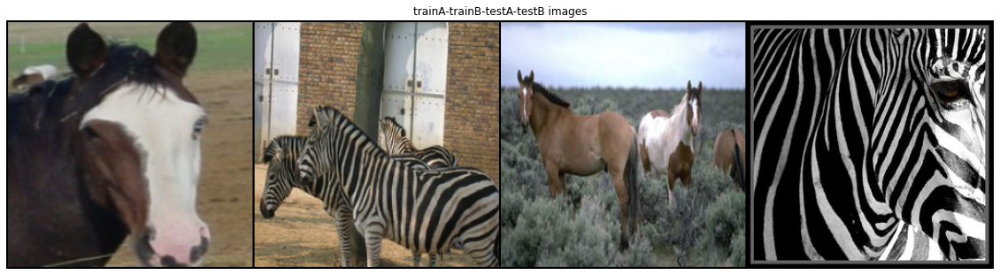

In [9]:
view_images(torch.cat((trainA_samples, trainB_samples, testA_samples, testB_samples), dim=0), info = 'trainA-trainB-testA-testB')

In [15]:
class residule_block(nn.Module) :
    def __init__(self, dim, activation, kernel_size=(3,3), strides=(1,1), padding='valid', use_bias=False) :
        super().__init__()
        self.activation = activation
        self.reflectionpad1 = nn.ReflectionPad2d(1)
        self.conv1 = nn.Conv2d(dim, dim, kernel_size=kernel_size, stride=strides, padding=padding, bias=use_bias)
        self.norm1 = nn.InstanceNorm2d(dim)
        self.reflectionpad2 = nn.ReflectionPad2d(1)
        self.conv2 = nn.Conv2d(dim, dim, kernel_size=kernel_size, stride=strides, padding=padding, bias=use_bias)
        self.norm2 = nn.InstanceNorm2d(dim)
    def forward(self, input_tensor) :
        x = self.reflectionpad1(input_tensor)
        x = self.conv1(x)
        x = self.norm1(x)
        x = self.activation(x)
        x = self.reflectionpad2(x)
        x = self.conv2(x)
        x = self.norm2(x)
        return input_tensor+x

In [25]:
class downsample(nn.Module) :
    def __init__(self, input_dims, filters, activation, kernel_size=(3,3), strides=(2,2), padding=1, use_bias=False) :
        super().__init__()
        self.conv1 = nn.Conv2d(input_dims, filters, kernel_size=kernel_size, stride=strides, padding=padding, bias=use_bias)
        self.norm1 = nn.InstanceNorm2d(filters)
        self.activation = activation
        
    def forward(self, input_tensor) :
        x = self.conv1(input_tensor)
        x = self.norm1(x)
        x = self.activation(x)
        return x
class upsample(nn.Module) :
    def __init__(self, input_dims, filters, activation, kernel_size=(3,3), strides=(2,2), padding=1, use_bias=False) :
        super().__init__()
        self.convtrans1 = nn.ConvTranspose2d(input_dims, filters, kernel_size=kernel_size, stride=strides, padding=padding, output_padding=1, bias=use_bias)
        self.norm1 = nn.InstanceNorm2d(filters)
        self.activation = activation
        
    def forward(self, input_tensor) :
        x = self.convtrans1(input_tensor)
        x = self.norm1(x)
        x = self.activation(x)
        return x

In [31]:
class Generator(nn.Module) :
    def __init__(self, input_dim=3, filters=64, num_downsampling_blocks=2, num_residual_blocks=9, num_upsample_blocks=2, name=None):
        super().__init__()
        model = [nn.ReflectionPad2d(3), \
                 nn.Conv2d(3, filters, kernel_size=(7,7), bias=False),\
                 nn.InstanceNorm2d(filters),\
                 nn.ReLU()]
        
        for _ in range(num_downsampling_blocks) :
            model += [downsample(filters, filters*2, nn.ReLU())]
            filters *= 2
        for _ in range(num_residual_blocks) :
            model += [residule_block(filters, nn.ReLU())]
        for _ in range(num_upsample_blocks) :
            model += [upsample(filters, filters//2, nn.ReLU())]         
            filters //= 2    
            
        model += [nn.ReflectionPad2d(3), 
                 nn.Conv2d(filters, 3, kernel_size=(7,7)),
                 nn.Tanh()]
        self.model = nn.Sequential(*model)
        
    def forward(self, x):
        x = self.model(x)
        return x

In [35]:
class Discriminator(nn.Module) :
    def __init__(self, input_dim=3, filters=64, num_downsampling=3, name=None) :
        super().__init__()
        model = [nn.Conv2d(3, filters, kernel_size=(4,4), stride=(2,2), padding=1),
                nn.LeakyReLU(0.2)]
        for i in range(num_downsampling) :
            if i < 2 :
                model += [downsample(filters, filters*2, nn.LeakyReLU(0.2), kernel_size=(4,4), strides=(2,2))]
            else :
                model += [downsample(filters, filters*2, nn.LeakyReLU(0.2), kernel_size=(4,4), strides=(1,1), padding='same')]
            filters *= 2
        model += [nn.Conv2d(filters, 1, kernel_size=(4,4), stride=(1,1), padding='same')]
        
        self.model = nn.Sequential(*model)
    def forward(self, x) :
        x = self.model(x)
        return x

In [36]:
class AverageMeter(object):
    """
    Keeps track of most recent, average, sum, and count of a metric.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

gen_G = Generator(name="generator_G")
gen_F = Generator(name="generator_F")
disc_X = Discriminator(name="discriminator_X")
disc_Y = Discriminator(name="discriminator_Y")

gen_G = gen_G.to(device)
gen_F = gen_F.to(device)
disc_X = disc_X.to(device)
disc_Y = disc_Y.to(device)

In [38]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d) :
        torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)

In [39]:
gen_G.apply(weights_init)
gen_F.apply(weights_init)
disc_X.apply(weights_init)
disc_X.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): downsample(
      (conv1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (norm1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (activation): LeakyReLU(negative_slope=0.2)
    )
    (3): downsample(
      (conv1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (norm1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (activation): LeakyReLU(negative_slope=0.2)
    )
    (4): downsample(
      (conv1): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=same, bias=False)
      (norm1): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (activation): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_si

In [40]:
lambda_cycle = 10.0
lambda_indentity=0.5

adv_loss_fn = nn.MSELoss().to(device)

gen_G_optimizer = torch.optim.Adam(gen_G.parameters(), lr=2e-4, betas=(0.5, 0.999))
gen_F_optimizer = torch.optim.Adam(gen_F.parameters(), lr=2e-4, betas=(0.5, 0.999))
disc_X_optimizer = torch.optim.Adam(disc_X.parameters(), lr=2e-4, betas=(0.5, 0.999))
disc_Y_optimizer = torch.optim.Adam(disc_Y.parameters(), lr=2e-4, betas=(0.5, 0.999))

def gen_loss_fn(fake) :
    fake_loss = adv_loss_fn(torch.ones_like(fake), fake)
    return fake_loss
def disc_loss_fn(real, fake) :
    real_loss = adv_loss_fn(torch.ones_like(real), real)
    fake_loss = adv_loss_fn(torch.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5

cycle_loss_fn = nn.L1Loss().to(device)
identity_loss_fn = nn.L1Loss().to(device)

epochs = 100

/opt/conda/lib/python3.7/site-packages/torch/nn/modules/conv.py:440: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448224956/work/aten/src/ATen/native/Convolution.cpp:660.)
  self.padding, self.dilation, self.groups)


Epoch: [0][0/1067]	G_loss: 8.5458 (8.5458)	F_loss: 9.7009 (9.7009)	X_loss: 2.1839 (2.1839)	Y_loss: 0.4941 (0.4941)	
Epoch: [0][200/1067]	G_loss: 3.6267 (4.9750)	F_loss: 3.4456 (4.9050)	X_loss: 0.2227 (0.5174)	Y_loss: 0.3409 (0.2900)	
Epoch: [0][400/1067]	G_loss: 3.0104 (4.6191)	F_loss: 4.8850 (4.4217)	X_loss: 0.2293 (0.4020)	Y_loss: 0.1494 (0.2580)	
Epoch: [0][600/1067]	G_loss: 3.2963 (4.4772)	F_loss: 4.7577 (4.2799)	X_loss: 0.2184 (0.3593)	Y_loss: 0.2384 (0.2378)	
Epoch: [0][800/1067]	G_loss: 3.6211 (4.3615)	F_loss: 3.2262 (4.1317)	X_loss: 0.3189 (0.3352)	Y_loss: 0.1509 (0.2274)	
Epoch: [0][1000/1067]	G_loss: 4.8145 (4.2819)	F_loss: 4.8664 (4.0279)	X_loss: 0.2999 (0.3228)	Y_loss: 0.2446 (0.2196)	


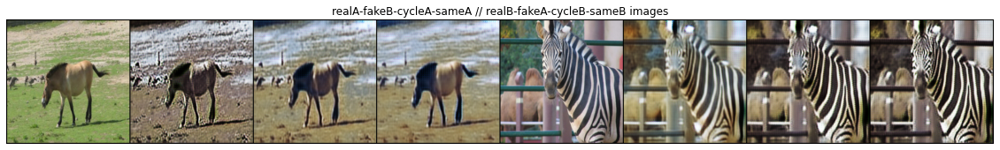

Epoch: [1][0/1067]	G_loss: 4.5875 (4.5875)	F_loss: 3.4723 (3.4723)	X_loss: 0.1233 (0.1233)	Y_loss: 0.1426 (0.1426)	
Epoch: [1][200/1067]	G_loss: 6.5106 (3.7562)	F_loss: 3.6598 (3.4882)	X_loss: 0.1763 (0.2395)	Y_loss: 0.1733 (0.2010)	
Epoch: [1][400/1067]	G_loss: 7.2647 (3.7379)	F_loss: 4.1782 (3.4867)	X_loss: 0.2095 (0.2521)	Y_loss: 0.1533 (0.1956)	
Epoch: [1][600/1067]	G_loss: 4.6879 (3.6675)	F_loss: 1.7185 (3.4325)	X_loss: 0.3658 (0.2655)	Y_loss: 0.0980 (0.1955)	
Epoch: [1][800/1067]	G_loss: 3.4435 (3.6520)	F_loss: 1.9996 (3.4013)	X_loss: 0.2690 (0.2620)	Y_loss: 0.1515 (0.1921)	
Epoch: [1][1000/1067]	G_loss: 2.9015 (3.6376)	F_loss: 2.6823 (3.3705)	X_loss: 0.1786 (0.2589)	Y_loss: 0.4193 (0.1896)	


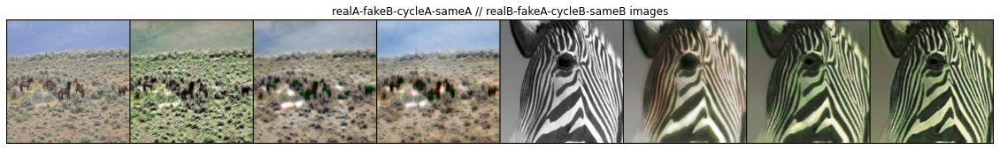

Epoch: [2][0/1067]	G_loss: 3.0919 (3.0919)	F_loss: 2.3601 (2.3601)	X_loss: 0.2410 (0.2410)	Y_loss: 0.0679 (0.0679)	
Epoch: [2][200/1067]	G_loss: 5.6739 (3.4872)	F_loss: 3.9088 (3.3572)	X_loss: 0.4746 (0.2495)	Y_loss: 0.2737 (0.1708)	
Epoch: [2][400/1067]	G_loss: 2.7741 (3.4558)	F_loss: 2.7203 (3.1983)	X_loss: 0.1488 (0.2502)	Y_loss: 0.0934 (0.1702)	
Epoch: [2][600/1067]	G_loss: 2.4804 (3.4388)	F_loss: 2.8642 (3.1810)	X_loss: 0.2423 (0.2463)	Y_loss: 0.1710 (0.1684)	
Epoch: [2][800/1067]	G_loss: 2.6770 (3.4031)	F_loss: 3.6164 (3.1669)	X_loss: 0.0841 (0.2460)	Y_loss: 0.0852 (0.1643)	
Epoch: [2][1000/1067]	G_loss: 3.0427 (3.4230)	F_loss: 2.7998 (3.1993)	X_loss: 0.2588 (0.2499)	Y_loss: 0.0400 (0.1643)	


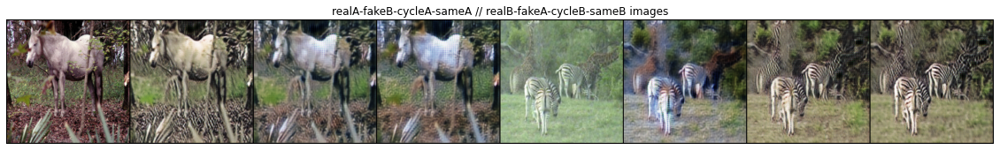

Epoch: [3][0/1067]	G_loss: 3.4388 (3.4388)	F_loss: 6.0236 (6.0236)	X_loss: 0.1733 (0.1733)	Y_loss: 0.1134 (0.1134)	
Epoch: [3][200/1067]	G_loss: 3.1452 (3.2368)	F_loss: 4.7070 (3.0814)	X_loss: 0.1912 (0.2335)	Y_loss: 0.1718 (0.1596)	
Epoch: [3][400/1067]	G_loss: 3.0178 (3.2305)	F_loss: 2.9912 (3.0669)	X_loss: 0.2679 (0.2377)	Y_loss: 0.4481 (0.1660)	
Epoch: [3][600/1067]	G_loss: 3.5257 (3.1946)	F_loss: 3.3748 (3.0821)	X_loss: 0.0858 (0.2340)	Y_loss: 0.1272 (0.1659)	
Epoch: [3][800/1067]	G_loss: 2.4228 (3.2008)	F_loss: 2.1955 (3.0735)	X_loss: 0.2235 (0.2370)	Y_loss: 0.1780 (0.1697)	
Epoch: [3][1000/1067]	G_loss: 3.0014 (3.1907)	F_loss: 3.1925 (3.0691)	X_loss: 0.4357 (0.2394)	Y_loss: 0.3259 (0.1689)	


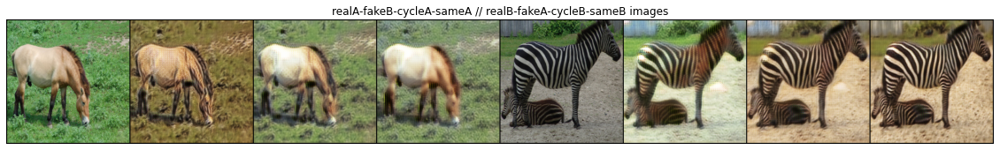

Epoch: [4][0/1067]	G_loss: 3.3267 (3.3267)	F_loss: 3.5029 (3.5029)	X_loss: 0.2339 (0.2339)	Y_loss: 0.2303 (0.2303)	
Epoch: [4][200/1067]	G_loss: 3.7124 (3.1736)	F_loss: 2.2170 (3.0321)	X_loss: 0.2573 (0.2360)	Y_loss: 0.1687 (0.1744)	
Epoch: [4][400/1067]	G_loss: 4.5896 (3.1302)	F_loss: 3.5017 (3.0108)	X_loss: 0.1875 (0.2329)	Y_loss: 0.0743 (0.1682)	
Epoch: [4][600/1067]	G_loss: 2.1848 (3.1445)	F_loss: 3.4137 (2.9997)	X_loss: 0.3721 (0.2347)	Y_loss: 0.1008 (0.1645)	
Epoch: [4][800/1067]	G_loss: 1.8412 (3.1174)	F_loss: 2.5355 (3.0274)	X_loss: 0.2962 (0.2337)	Y_loss: 0.2567 (0.1662)	
Epoch: [4][1000/1067]	G_loss: 6.4345 (3.0906)	F_loss: 2.1931 (2.9914)	X_loss: 0.3311 (0.2359)	Y_loss: 0.1334 (0.1656)	


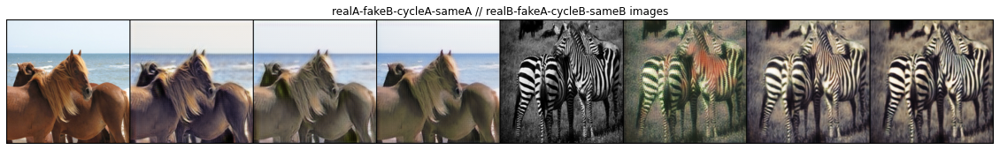

Epoch: [5][0/1067]	G_loss: 3.6690 (3.6690)	F_loss: 4.5165 (4.5165)	X_loss: 0.1766 (0.1766)	Y_loss: 0.0545 (0.0545)	
Epoch: [5][200/1067]	G_loss: 2.6358 (2.9925)	F_loss: 2.5870 (2.8977)	X_loss: 0.1038 (0.2180)	Y_loss: 0.0198 (0.1545)	
Epoch: [5][400/1067]	G_loss: 2.2320 (2.9900)	F_loss: 3.6666 (2.9941)	X_loss: 0.0370 (0.2237)	Y_loss: 0.1477 (0.1632)	
Epoch: [5][600/1067]	G_loss: 2.1069 (2.9614)	F_loss: 3.3799 (2.9981)	X_loss: 0.0430 (0.2266)	Y_loss: 0.0967 (0.1623)	
Epoch: [5][800/1067]	G_loss: 2.1049 (2.9837)	F_loss: 2.7874 (2.9771)	X_loss: 0.2075 (0.2290)	Y_loss: 0.2186 (0.1628)	
Epoch: [5][1000/1067]	G_loss: 2.1211 (2.9884)	F_loss: 2.9576 (2.9437)	X_loss: 0.3260 (0.2321)	Y_loss: 0.1763 (0.1624)	


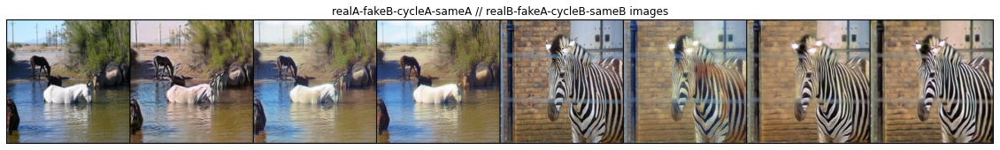

Epoch: [6][0/1067]	G_loss: 3.3687 (3.3687)	F_loss: 4.0067 (4.0067)	X_loss: 0.1339 (0.1339)	Y_loss: 0.1529 (0.1529)	
Epoch: [6][200/1067]	G_loss: 2.7869 (2.9463)	F_loss: 3.4858 (2.9130)	X_loss: 0.5622 (0.2200)	Y_loss: 0.4237 (0.1559)	
Epoch: [6][400/1067]	G_loss: 3.1789 (2.9596)	F_loss: 1.7270 (2.9498)	X_loss: 0.2135 (0.2224)	Y_loss: 0.2789 (0.1629)	
Epoch: [6][600/1067]	G_loss: 2.5077 (2.9818)	F_loss: 2.3702 (2.9111)	X_loss: 0.1631 (0.2252)	Y_loss: 0.4018 (0.1585)	
Epoch: [6][800/1067]	G_loss: 2.0150 (2.9883)	F_loss: 3.3282 (2.9235)	X_loss: 0.2499 (0.2245)	Y_loss: 0.0722 (0.1593)	
Epoch: [6][1000/1067]	G_loss: 3.0603 (2.9563)	F_loss: 3.8579 (2.9148)	X_loss: 0.1449 (0.2245)	Y_loss: 0.3046 (0.1595)	


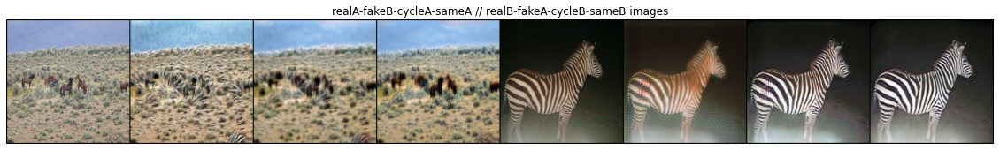

Epoch: [7][0/1067]	G_loss: 2.5724 (2.5724)	F_loss: 2.1470 (2.1470)	X_loss: 0.1342 (0.1342)	Y_loss: 0.2096 (0.2096)	
Epoch: [7][200/1067]	G_loss: 2.0981 (2.9061)	F_loss: 5.3656 (2.8438)	X_loss: 0.1392 (0.2310)	Y_loss: 0.1031 (0.1692)	
Epoch: [7][400/1067]	G_loss: 2.0583 (2.8928)	F_loss: 3.1905 (2.7825)	X_loss: 0.0596 (0.2273)	Y_loss: 0.0752 (0.1585)	
Epoch: [7][600/1067]	G_loss: 3.7371 (2.9378)	F_loss: 3.5843 (2.8278)	X_loss: 0.4135 (0.2279)	Y_loss: 0.4461 (0.1568)	
Epoch: [7][800/1067]	G_loss: 2.9044 (2.9081)	F_loss: 1.5069 (2.8327)	X_loss: 0.2303 (0.2300)	Y_loss: 0.1254 (0.1565)	
Epoch: [7][1000/1067]	G_loss: 2.7821 (2.8819)	F_loss: 2.8000 (2.8269)	X_loss: 0.1497 (0.2279)	Y_loss: 0.2090 (0.1592)	


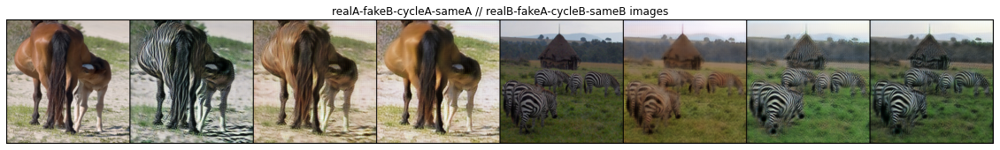

Epoch: [8][0/1067]	G_loss: 2.4453 (2.4453)	F_loss: 2.0043 (2.0043)	X_loss: 0.0764 (0.0764)	Y_loss: 0.1288 (0.1288)	
Epoch: [8][200/1067]	G_loss: 2.4085 (2.8370)	F_loss: 3.3235 (2.7473)	X_loss: 0.2706 (0.2284)	Y_loss: 0.1700 (0.1636)	
Epoch: [8][400/1067]	G_loss: 1.8060 (2.8151)	F_loss: 3.5970 (2.7912)	X_loss: 0.1760 (0.2262)	Y_loss: 0.3919 (0.1647)	
Epoch: [8][600/1067]	G_loss: 3.3532 (2.8274)	F_loss: 2.1091 (2.7878)	X_loss: 0.2685 (0.2237)	Y_loss: 0.1850 (0.1627)	
Epoch: [8][800/1067]	G_loss: 2.6481 (2.8366)	F_loss: 1.8116 (2.8120)	X_loss: 0.5235 (0.2251)	Y_loss: 0.1563 (0.1630)	
Epoch: [8][1000/1067]	G_loss: 2.5244 (2.8202)	F_loss: 1.3462 (2.7912)	X_loss: 0.2607 (0.2229)	Y_loss: 0.1502 (0.1613)	


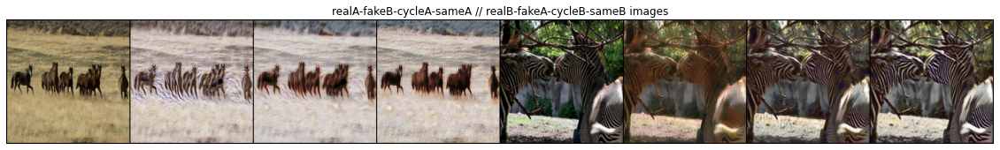

Epoch: [9][0/1067]	G_loss: 3.2333 (3.2333)	F_loss: 2.4485 (2.4485)	X_loss: 0.4027 (0.4027)	Y_loss: 0.1791 (0.1791)	
Epoch: [9][200/1067]	G_loss: 1.6300 (2.8963)	F_loss: 2.1192 (2.7478)	X_loss: 0.2949 (0.2194)	Y_loss: 0.1797 (0.1532)	
Epoch: [9][400/1067]	G_loss: 2.1719 (2.8453)	F_loss: 2.7301 (2.7689)	X_loss: 0.2663 (0.2177)	Y_loss: 0.1031 (0.1485)	
Epoch: [9][600/1067]	G_loss: 3.0392 (2.8482)	F_loss: 3.7581 (2.8233)	X_loss: 0.1034 (0.2181)	Y_loss: 0.2149 (0.1462)	
Epoch: [9][800/1067]	G_loss: 4.3086 (2.8536)	F_loss: 3.0442 (2.8060)	X_loss: 0.3966 (0.2188)	Y_loss: 0.0818 (0.1517)	
Epoch: [9][1000/1067]	G_loss: 2.5505 (2.8381)	F_loss: 2.4932 (2.8007)	X_loss: 0.0957 (0.2190)	Y_loss: 0.0588 (0.1529)	


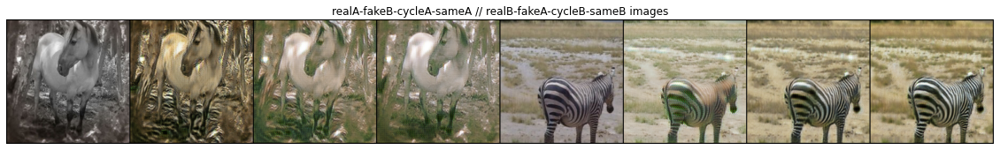

Epoch: [10][0/1067]	G_loss: 4.1044 (4.1044)	F_loss: 3.2853 (3.2853)	X_loss: 0.1593 (0.1593)	Y_loss: 0.0657 (0.0657)	
Epoch: [10][200/1067]	G_loss: 3.2119 (2.8624)	F_loss: 5.2163 (2.8387)	X_loss: 0.0847 (0.2116)	Y_loss: 0.1799 (0.1473)	
Epoch: [10][400/1067]	G_loss: 2.7146 (2.8015)	F_loss: 3.5066 (2.7518)	X_loss: 0.1932 (0.2153)	Y_loss: 0.1281 (0.1498)	
Epoch: [10][600/1067]	G_loss: 3.1155 (2.7882)	F_loss: 2.3173 (2.7379)	X_loss: 0.1757 (0.2188)	Y_loss: 0.0953 (0.1509)	
Epoch: [10][800/1067]	G_loss: 2.2597 (2.7796)	F_loss: 1.5598 (2.7541)	X_loss: 0.1738 (0.2160)	Y_loss: 0.0544 (0.1510)	
Epoch: [10][1000/1067]	G_loss: 2.8885 (2.7871)	F_loss: 3.0710 (2.7577)	X_loss: 0.1762 (0.2168)	Y_loss: 0.0360 (0.1530)	


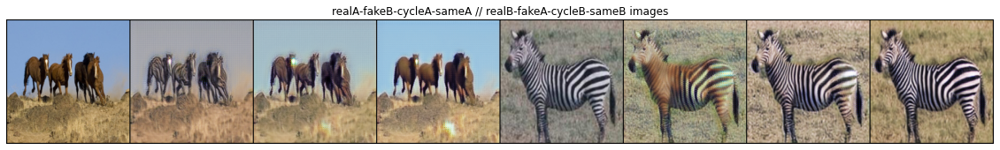

Epoch: [11][0/1067]	G_loss: 3.5707 (3.5707)	F_loss: 2.5058 (2.5058)	X_loss: 0.1507 (0.1507)	Y_loss: 0.4056 (0.4056)	
Epoch: [11][200/1067]	G_loss: 2.5069 (2.6803)	F_loss: 2.0814 (2.8109)	X_loss: 0.0860 (0.2147)	Y_loss: 0.0380 (0.1569)	
Epoch: [11][400/1067]	G_loss: 2.6413 (2.7443)	F_loss: 3.1283 (2.7842)	X_loss: 0.2120 (0.2097)	Y_loss: 0.0751 (0.1491)	
Epoch: [11][600/1067]	G_loss: 2.9875 (2.7675)	F_loss: 3.0292 (2.7979)	X_loss: 0.1758 (0.2116)	Y_loss: 0.0617 (0.1488)	
Epoch: [11][800/1067]	G_loss: 2.8274 (2.7719)	F_loss: 1.5445 (2.7580)	X_loss: 0.5212 (0.2132)	Y_loss: 1.0051 (0.1507)	
Epoch: [11][1000/1067]	G_loss: 4.5865 (2.7595)	F_loss: 3.2502 (2.7448)	X_loss: 0.1907 (0.2136)	Y_loss: 0.1703 (0.1518)	


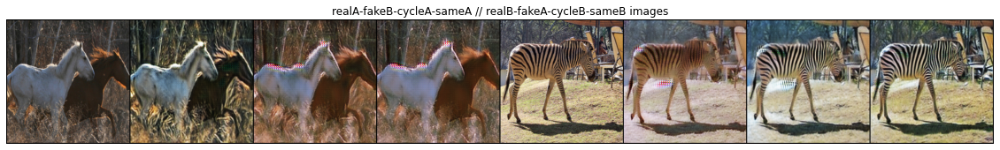

Epoch: [12][0/1067]	G_loss: 2.0521 (2.0521)	F_loss: 1.9243 (1.9243)	X_loss: 0.2713 (0.2713)	Y_loss: 0.1263 (0.1263)	
Epoch: [12][200/1067]	G_loss: 3.2392 (2.7227)	F_loss: 3.4741 (2.6170)	X_loss: 0.0671 (0.2233)	Y_loss: 0.2290 (0.1548)	
Epoch: [12][400/1067]	G_loss: 4.0490 (2.7664)	F_loss: 2.0110 (2.6704)	X_loss: 0.1150 (0.2155)	Y_loss: 0.0919 (0.1551)	
Epoch: [12][600/1067]	G_loss: 3.6373 (2.7706)	F_loss: 2.1661 (2.6755)	X_loss: 0.2982 (0.2136)	Y_loss: 0.4491 (0.1555)	
Epoch: [12][800/1067]	G_loss: 1.7654 (2.7513)	F_loss: 2.1864 (2.6887)	X_loss: 0.0629 (0.2149)	Y_loss: 0.0881 (0.1560)	
Epoch: [12][1000/1067]	G_loss: 2.2475 (2.7539)	F_loss: 2.9962 (2.6754)	X_loss: 0.1274 (0.2146)	Y_loss: 0.1550 (0.1547)	


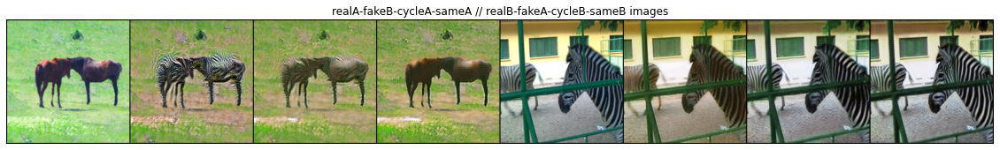

Epoch: [13][0/1067]	G_loss: 1.5779 (1.5779)	F_loss: 2.3680 (2.3680)	X_loss: 0.2505 (0.2505)	Y_loss: 0.3968 (0.3968)	
Epoch: [13][200/1067]	G_loss: 2.3806 (2.6233)	F_loss: 2.1948 (2.6642)	X_loss: 0.1546 (0.2165)	Y_loss: 0.3442 (0.1596)	
Epoch: [13][400/1067]	G_loss: 3.3151 (2.6627)	F_loss: 2.4993 (2.6540)	X_loss: 0.1595 (0.2162)	Y_loss: 0.0413 (0.1576)	
Epoch: [13][600/1067]	G_loss: 7.6439 (2.6748)	F_loss: 1.6888 (2.6783)	X_loss: 0.2368 (0.2148)	Y_loss: 0.2117 (0.1593)	
Epoch: [13][800/1067]	G_loss: 2.1166 (2.6866)	F_loss: 4.7152 (2.6859)	X_loss: 0.1156 (0.2143)	Y_loss: 0.1682 (0.1573)	
Epoch: [13][1000/1067]	G_loss: 3.2672 (2.6629)	F_loss: 3.0962 (2.6664)	X_loss: 0.3958 (0.2133)	Y_loss: 0.2773 (0.1568)	


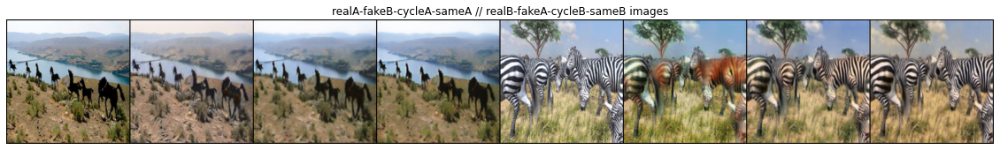

Epoch: [14][0/1067]	G_loss: 1.8266 (1.8266)	F_loss: 2.9528 (2.9528)	X_loss: 0.0896 (0.0896)	Y_loss: 0.0814 (0.0814)	


KeyboardInterrupt: 

In [41]:
for epoch in range(epochs) :
    gen_G.train()
    gen_F.train()
    disc_X.train()
    disc_Y.train()
    
    g_loss_tracker = AverageMeter()
    f_loss_tracker = AverageMeter()
    x_loss_tracker = AverageMeter()
    y_loss_tracker = AverageMeter()
    i = 0
    batch_len = min(len(trainA_loader), len(trainB_loader))
    for real_x, real_y in zip(trainA_loader, trainB_loader):
        real_x = real_x.to(device)
        real_y = real_y.to(device)
        
        fake_y = gen_G(real_x)
        fake_x = gen_F(real_y)
        
        cycled_x = gen_F(fake_y)
        cycled_y = gen_G(fake_x)
        
        same_x = gen_F(real_x)
        same_y = gen_G(real_y)
        
        disc_real_x = disc_X(real_x)
        disc_fake_x = disc_X(fake_x)
        
        disc_real_y = disc_Y(real_y)
        disc_fake_y = disc_Y(fake_y)
        
        gen_G_loss = gen_loss_fn(disc_fake_y)
        gen_F_loss = gen_loss_fn(disc_fake_x)
        
        cycle_loss_G = cycle_loss_fn(real_y, cycled_y) * lambda_cycle
        cycle_loss_F = cycle_loss_fn(real_x, cycled_x) * lambda_cycle
        
        id_loss_G = identity_loss_fn(real_y, same_y) * lambda_cycle * lambda_indentity
        id_loss_F = identity_loss_fn(real_x, same_x) * lambda_cycle * lambda_indentity
        
        total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
        total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F
        
        disc_X_loss = disc_loss_fn(disc_real_x, disc_X(fake_x.detach()))
        disc_Y_loss = disc_loss_fn(disc_real_y, disc_Y(fake_y.detach()))
        
        gen_G_optimizer.zero_grad()
        gen_F_optimizer.zero_grad()
        
        total_loss_G.backward(retain_graph=True)
        total_loss_F.backward()
        
        gen_G_optimizer.step()
        gen_F_optimizer.step()
        
        g_loss_tracker.update(np.mean(total_loss_G.item()))
        f_loss_tracker.update(np.mean(total_loss_F.item()))
        
        disc_X_optimizer.zero_grad()
        disc_Y_optimizer.zero_grad()
        
        disc_X_loss.backward(retain_graph=True)
        disc_Y_loss.backward()
        
        disc_X_optimizer.step()
        disc_Y_optimizer.step()
        
        x_loss_tracker.update(np.mean(disc_X_loss.item()))
        y_loss_tracker.update(np.mean(disc_Y_loss.item()))
        
        if i % 200 == 0:
            print('Epoch: [{0}][{1}/{2}]\t'
                  'G_loss: {g_loss_tracker.val:.4f} ({g_loss_tracker.avg:.4f})\t'
                  'F_loss: {f_loss_tracker.val:.4f} ({f_loss_tracker.avg:.4f})\t'
                  'X_loss: {x_loss_tracker.val:.4f} ({x_loss_tracker.avg:.4f})\t'
                  'Y_loss: {y_loss_tracker.val:.4f} ({y_loss_tracker.avg:.4f})\t'
                  .format(epoch, i, min(len(trainA_loader), len(trainB_loader)),
                          g_loss_tracker=g_loss_tracker,
                          f_loss_tracker=f_loss_tracker,
                          x_loss_tracker=x_loss_tracker,
                          y_loss_tracker=y_loss_tracker))
        i+=1
    view_images(torch.cat((real_x,fake_y, cycled_x, same_x, real_y,fake_x, cycled_y, same_y), dim=0), \
                info = 'realA-fakeB-cycleA-sameA // realB-fakeA-cycleB-sameB')
            
        

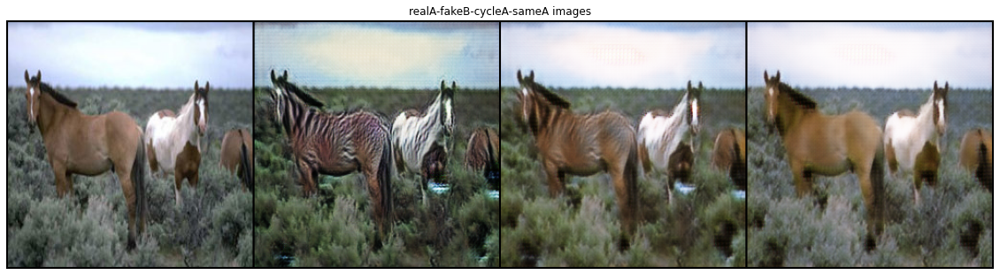

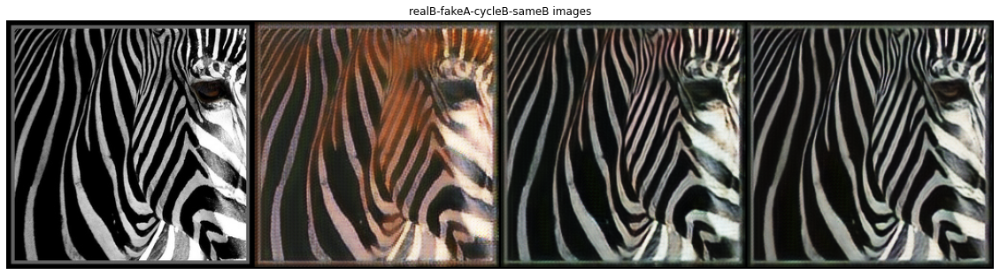

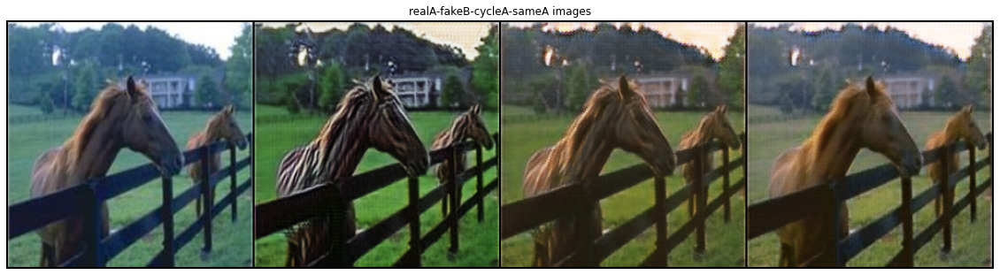

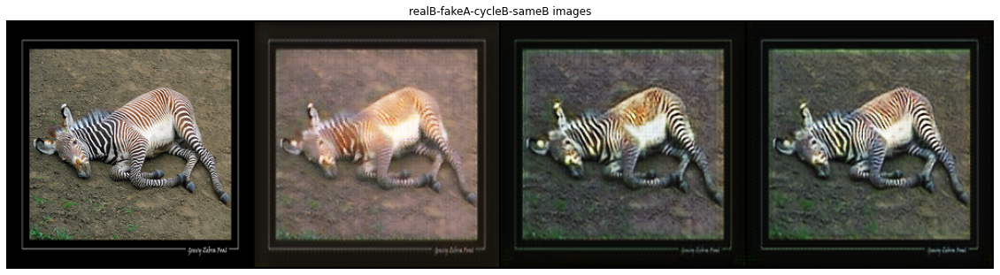

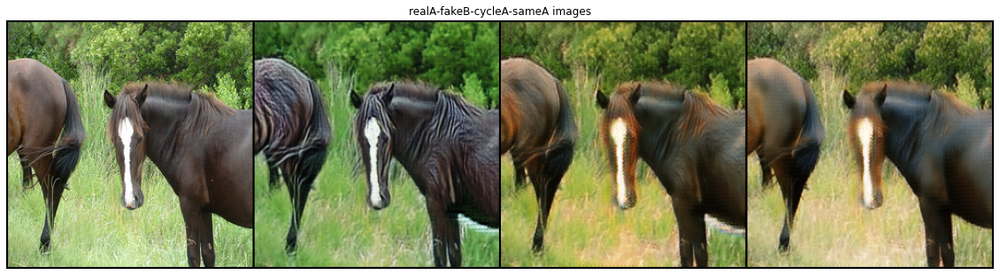

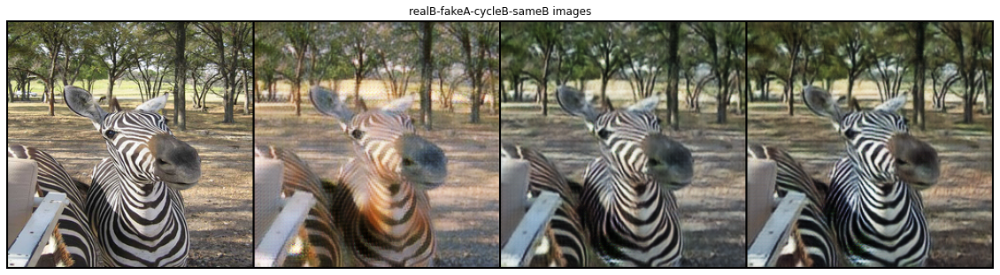

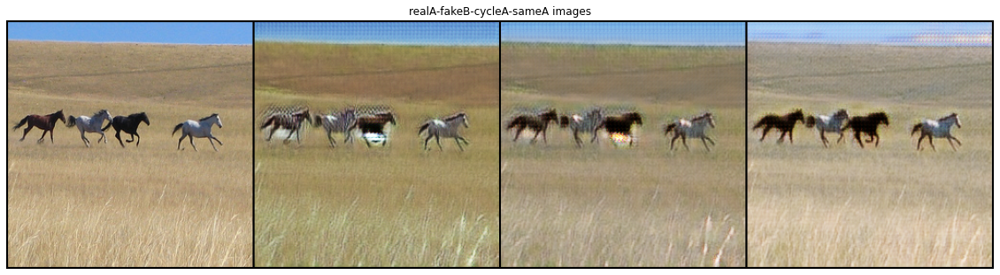

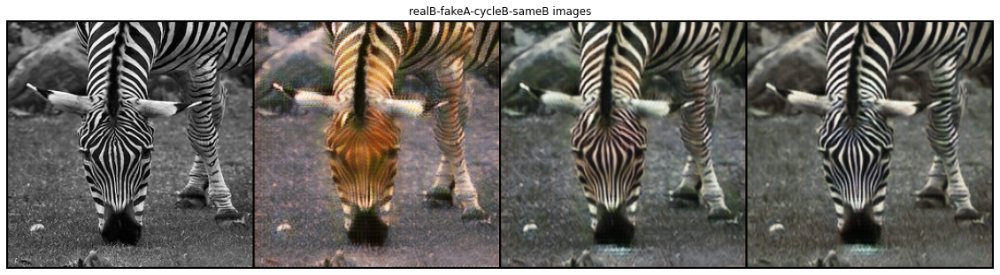

In [42]:
## model test
gen_G.eval()
gen_F.eval()
disc_X.eval()
disc_Y.eval()
i = 0
for real_x, real_y in zip(testA_loader, testB_loader):
    i+=1
    real_x = real_x.to(device)
    real_y = real_y.to(device)

    fake_y = gen_G(real_x)
    fake_x = gen_F(real_y)

    cycled_x = gen_F(fake_y)
    cycled_y = gen_G(fake_x)

    same_x = gen_F(real_x)
    same_y = gen_G(real_y)
    view_images(torch.cat((real_x,fake_y, cycled_x, same_x), dim=0), \
                info = 'realA-fakeB-cycleA-sameA')
    view_images(torch.cat((real_y,fake_x, cycled_y, same_y), dim=0), \
                info = 'realB-fakeA-cycleB-sameB')
    if i == 4 :
        break

## Multi object

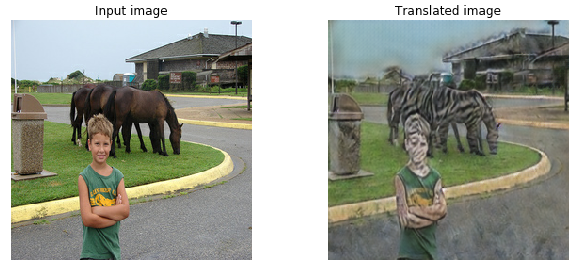

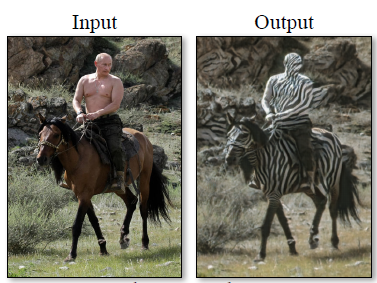